In [15]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, UpSampling2D,Input
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.preprocessing import image
import keras
from keras import layers,Model
from tqdm import tqdm
from math import log10, sqrt

In [16]:
train_path = '../input/butterfly-dataset/test/'
test_path = '../input/butterfly-dataset/train/'
train = []
for filename in os.listdir(train_path):
    if filename.endswith('.jpg'):
        img = image.load_img(train_path + filename, target_size=(128, 128))
        img = image.img_to_array(img)
        train.append(img)
train = np.array(train)

test = []
for filename in os.listdir(test_path):
    if filename.endswith('.jpg'):
        img = image.load_img(test_path + filename, target_size=(128, 128))
        img = image.img_to_array(img)
        test.append(img)
test = np.array(test)

In [17]:
x_train = train.astype('float32') / 255
x_test = test.astype('float32') / 255

In [18]:
def show_data(X, n=10,title=""):
    plt.figure(figsize=(10, 3))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        plt.imshow(X[i])
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.suptitle(title, fontsize = 20)

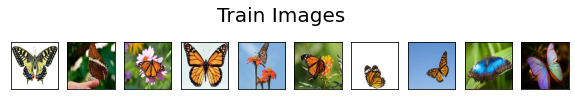

In [19]:
show_data(x_train,title= "Train Images")

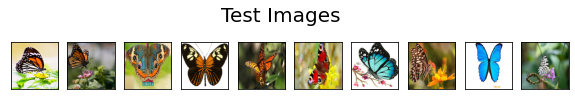

In [20]:
show_data(x_test,title= "Test Images")

In [28]:
# input_img = keras.Input(shape=(128,128,3))

# x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
# encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
# x = layers.UpSampling2D((2, 2))(x)
# x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
# x = layers.UpSampling2D((2, 2))(x)
# x = layers.Conv2D(16, (3, 3), activation='relu')(x)
# x = layers.UpSampling2D((2, 2))(x)
# decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)


#Model
input_img = Input(shape=(128, 128, 3))

x = Conv2D(128, kernel_size=(3,3), activation="relu", padding = "same")(input_img)
x = MaxPooling2D(pool_size = (2,2), padding = "same")(x)

x = Conv2D(64, kernel_size=(3,3), activation="relu", padding = "same")(x)
encoded = MaxPooling2D(pool_size = (2,2), padding = "same")(x)

x = Conv2D(64, kernel_size=(3,3), activation="relu", padding = "same")(encoded)
x = UpSampling2D((2,2))(x)

x = Conv2D(128, kernel_size=(3,3), activation="relu", padding = "same")(x)
x = UpSampling2D((2,2))(x)

decoded = Conv2D(3, kernel_size=(3,3), activation="sigmoid", padding = "same")(x)

In [29]:
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [38]:
loss_dict = {"adam":0.0,"rmsprop":0.0,"adadelta":0.0,"adagrad":0.0,"nadam":0.0,"sgd":0.0}
def train_model(input_layer,output_layer,optimizer,epochs,batch_size):
    autoencoder = Model(input_layer,output_layer)
    autoencoder.compile(optimizer=optimizer,loss = "binary_crossentropy",metrics = ["mean_squared_error"])
#     print(autoencoder.summary())
    print("With", optimizer,"optimizer and",epochs,"epochs")
    hist = autoencoder.fit(x_train,x_train,epochs = epochs,batch_size = batch_size,validation_data = (x_test,x_test),verbose = 0)
    loss_dict[optimizer] = hist.history["val_loss"][-1]
    decoded_images = autoencoder.predict(x_test)
    n = 10
    plt.figure(figsize=(20, 4))
    for i in range(1, n + 1):
        # Display original
        plt.suptitle("Original", fontsize = 20)
        ax = plt.subplot(2, n, i)
        plt.imshow(x_test[i].reshape(128,128,3))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()
    
    plt.figure(figsize=(20,4))
    
    for i in range(1, n + 1):
        # Display reconstruction
        plt.suptitle("Reconstructed", fontsize = 20)
        ax = plt.subplot(2, n, i)
        plt.imshow(decoded_images[i].reshape(128,128,3))
        plt.gray()
        plt.title(f"PSNR:{round(PSNR(x_test[i],decoded_images[i]),2)}")
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

  0%|          | 0/6 [00:00<?, ?it/s]

With adam optimizer and 1 epochs


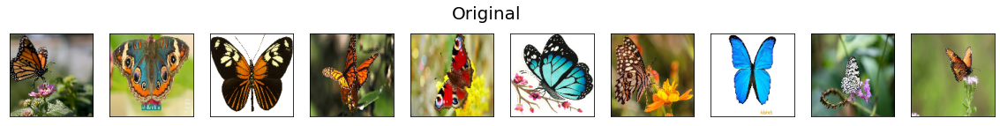

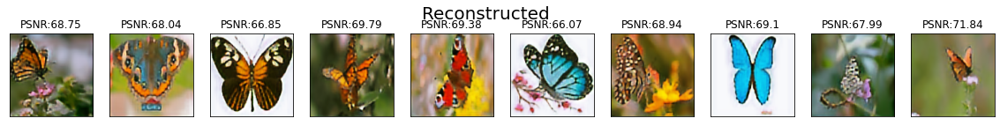

With adam optimizer and 50 epochs


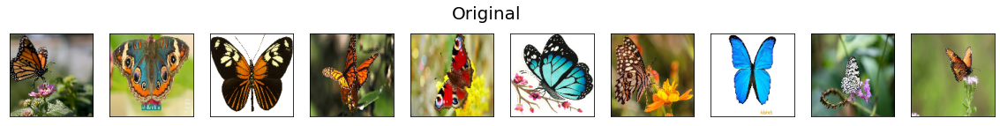

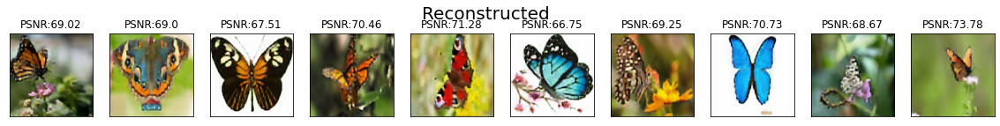

With adam optimizer and 100 epochs


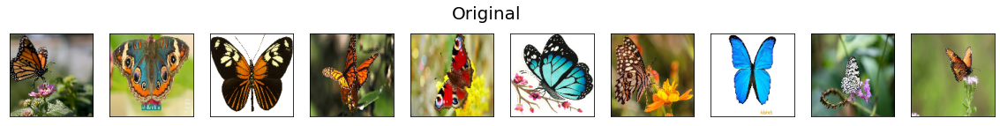

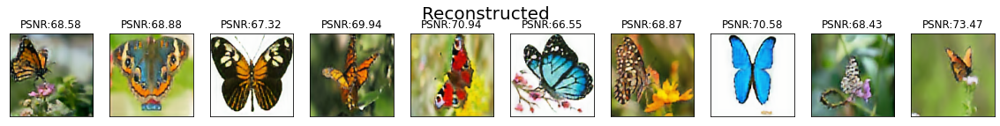

With adam optimizer and 200 epochs


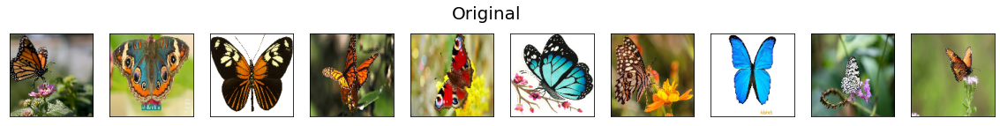

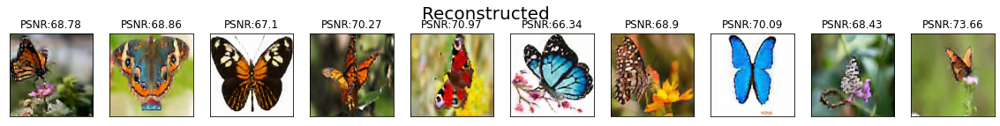

With adam optimizer and 300 epochs


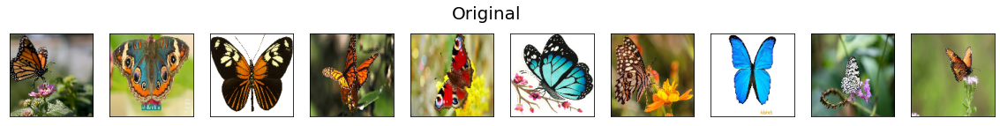

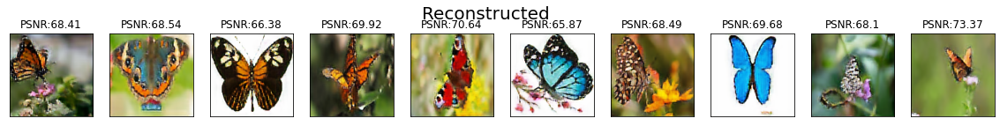

 17%|█▋        | 1/6 [01:08<05:43, 68.75s/it]

With rmsprop optimizer and 1 epochs


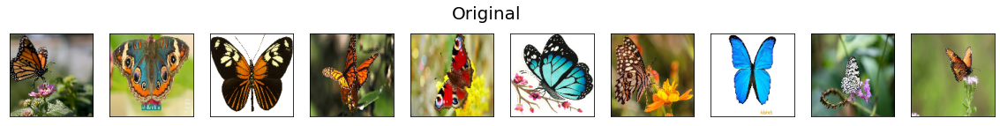

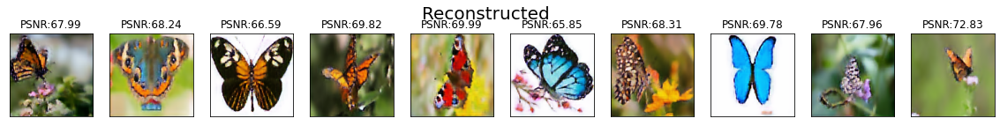

With rmsprop optimizer and 50 epochs


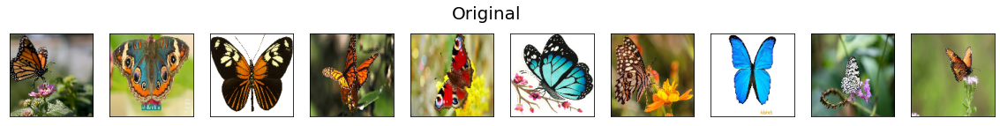

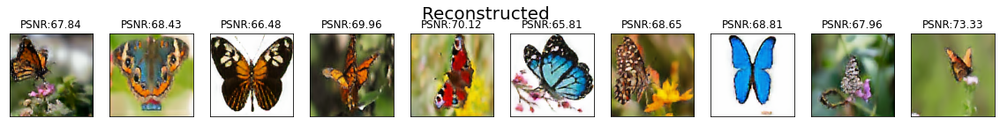

With rmsprop optimizer and 100 epochs


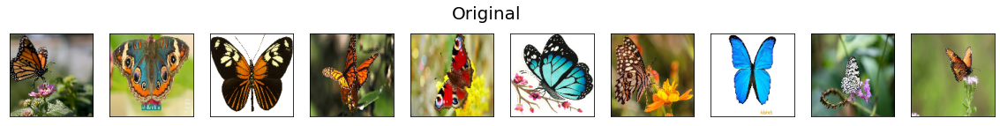

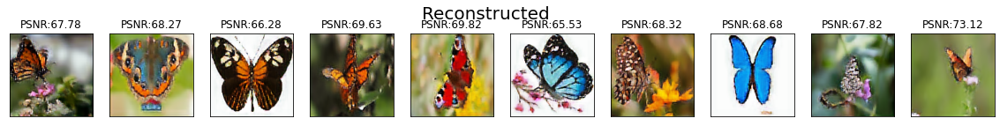

With rmsprop optimizer and 200 epochs


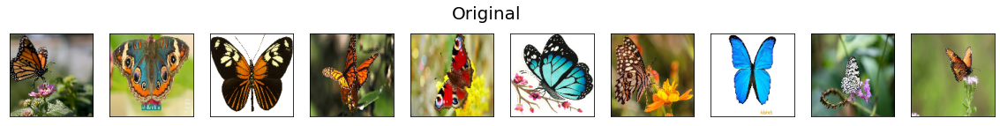

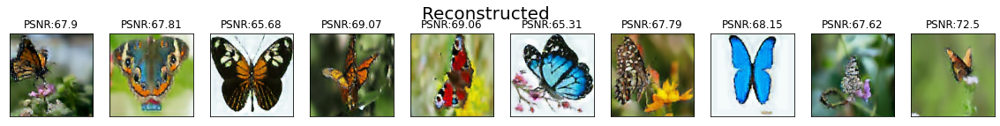

With rmsprop optimizer and 300 epochs


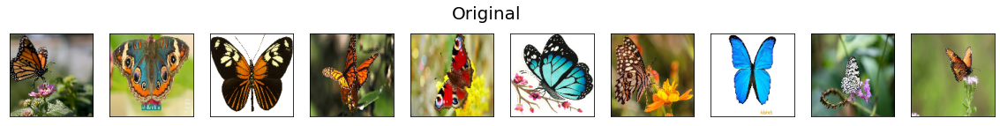

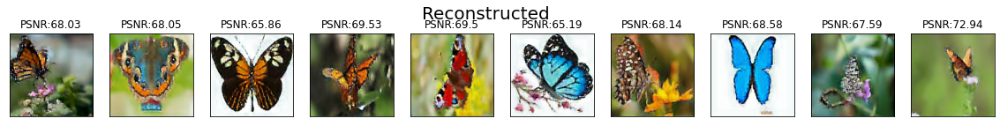

 33%|███▎      | 2/6 [02:27<04:59, 74.75s/it]

With adadelta optimizer and 1 epochs


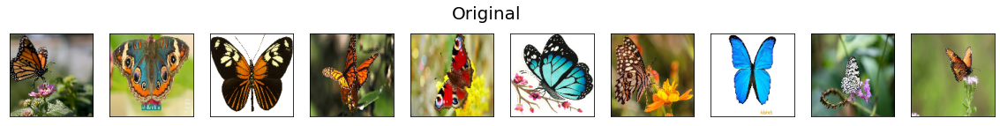

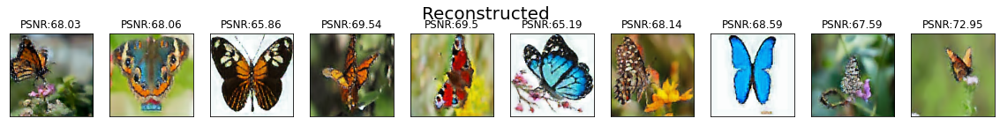

With adadelta optimizer and 50 epochs


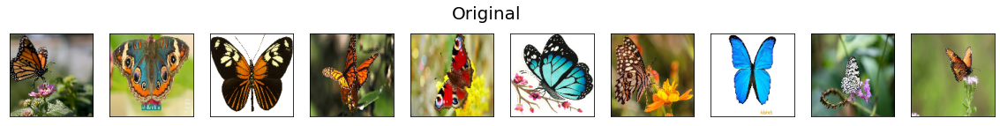

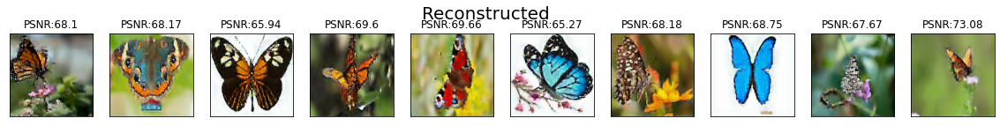

With adadelta optimizer and 100 epochs


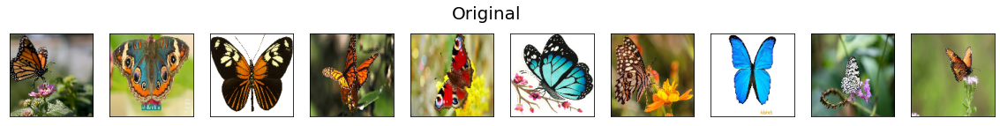

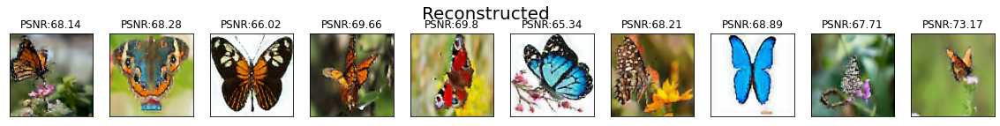

With adadelta optimizer and 200 epochs


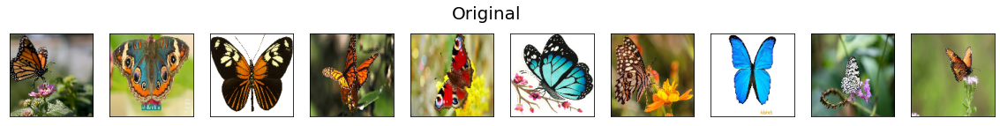

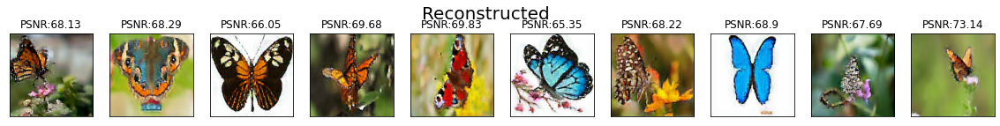

With adadelta optimizer and 300 epochs


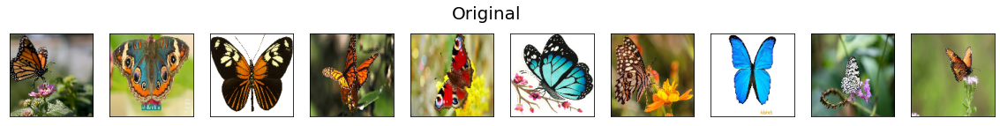

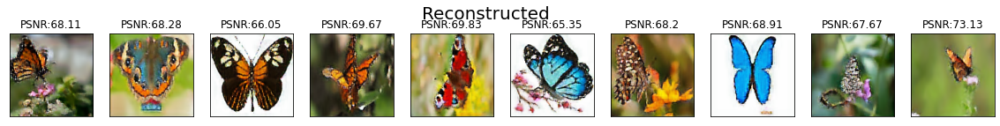

 50%|█████     | 3/6 [03:51<03:56, 78.94s/it]

With adagrad optimizer and 1 epochs


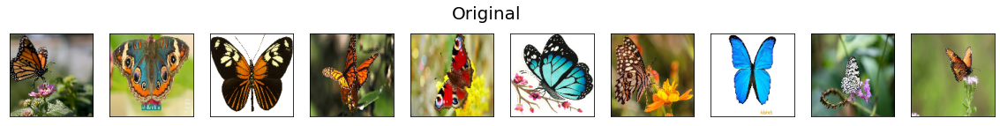

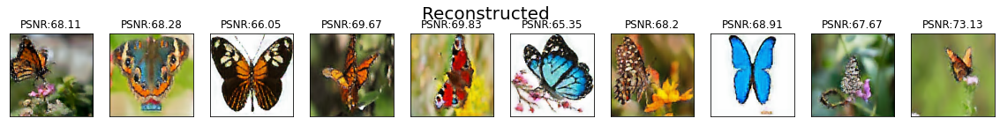

With adagrad optimizer and 50 epochs


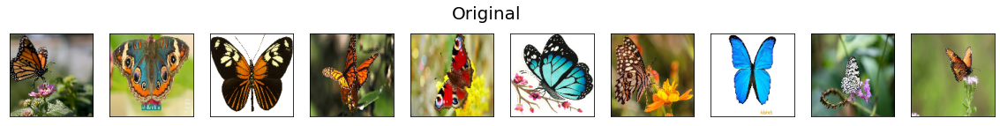

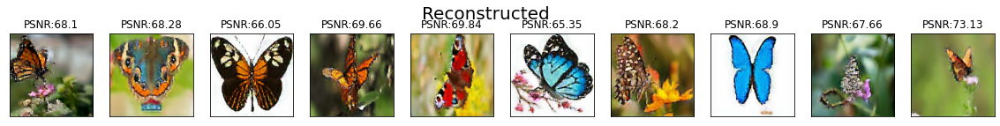

With adagrad optimizer and 100 epochs


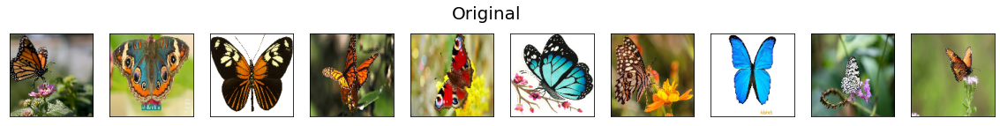

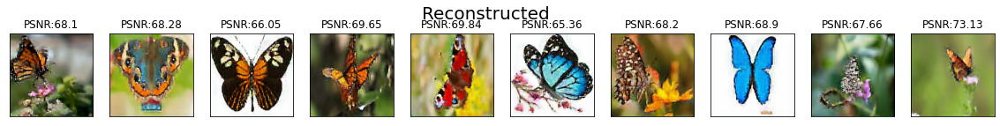

With adagrad optimizer and 200 epochs


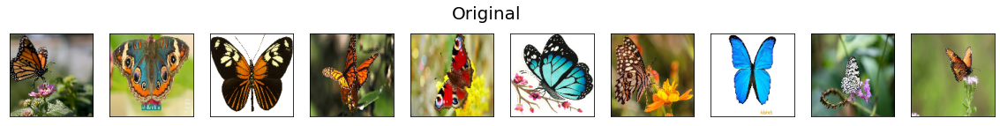

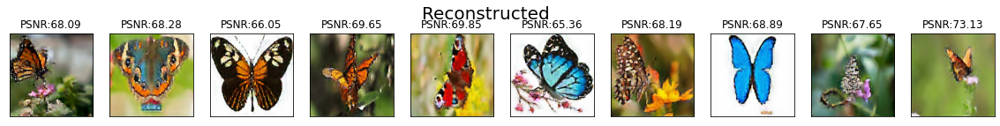

With adagrad optimizer and 300 epochs


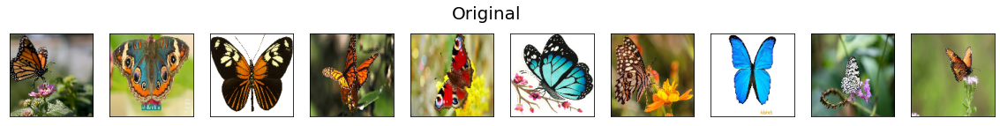

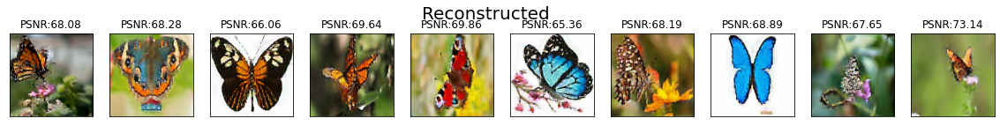

 67%|██████▋   | 4/6 [04:53<02:24, 72.20s/it]

With nadam optimizer and 1 epochs


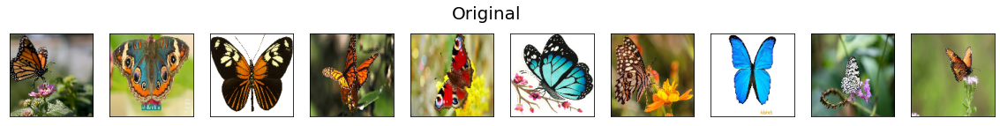

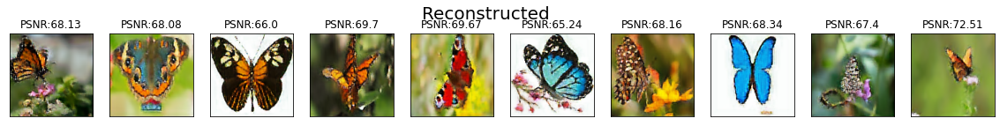

With nadam optimizer and 50 epochs


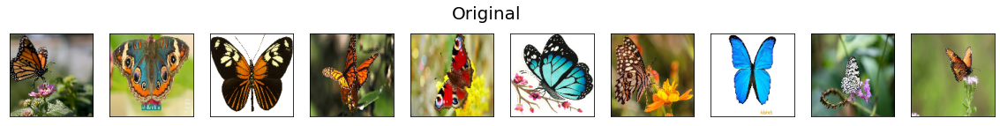

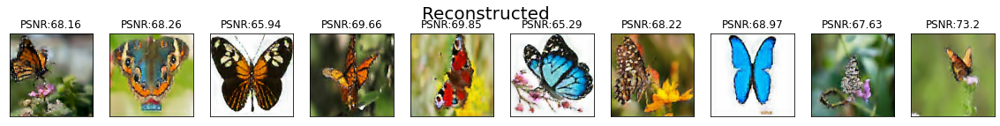

With nadam optimizer and 100 epochs


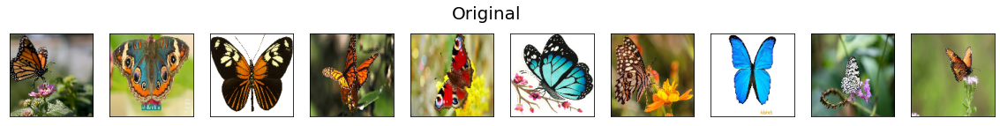

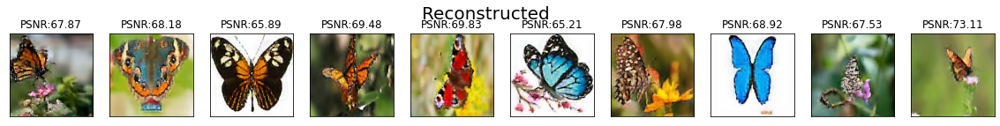

With nadam optimizer and 200 epochs


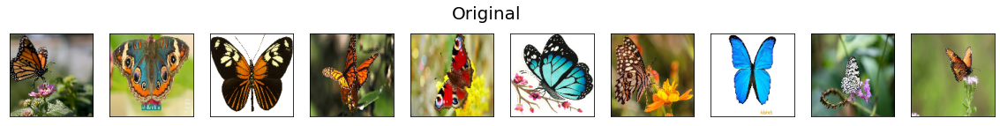

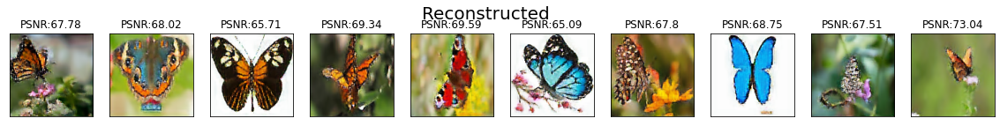

With nadam optimizer and 300 epochs


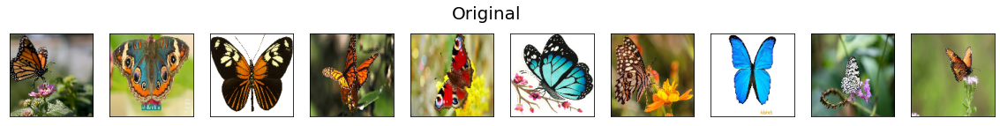

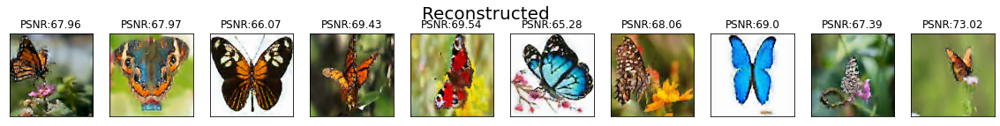

 83%|████████▎ | 5/6 [06:01<01:10, 70.75s/it]

With sgd optimizer and 1 epochs


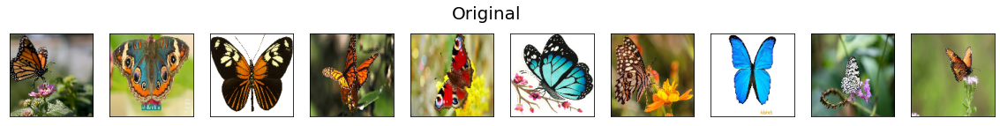

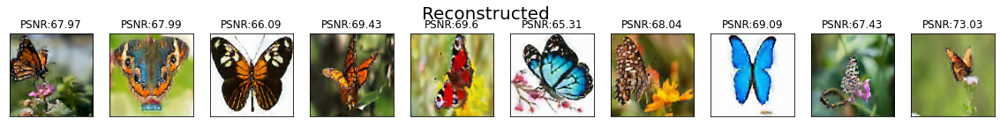

With sgd optimizer and 50 epochs


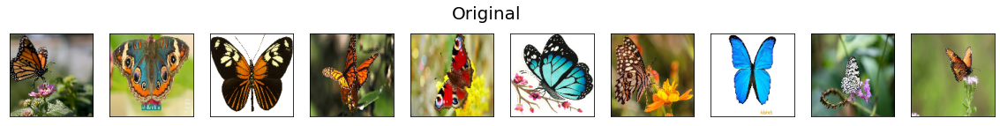

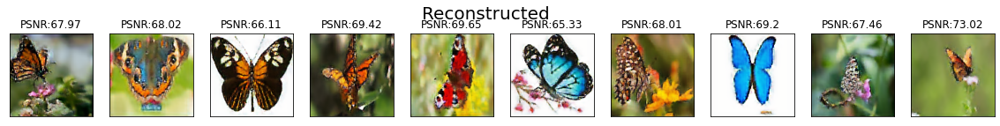

With sgd optimizer and 100 epochs


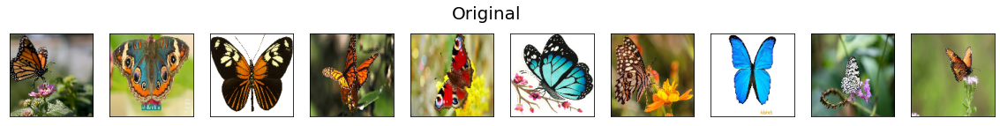

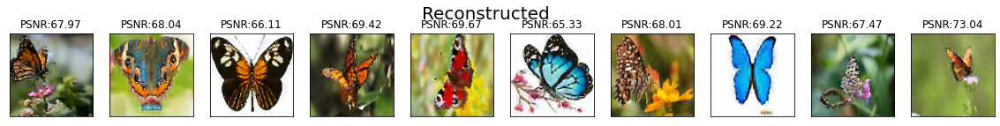

With sgd optimizer and 200 epochs


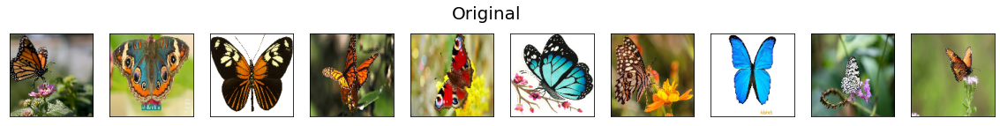

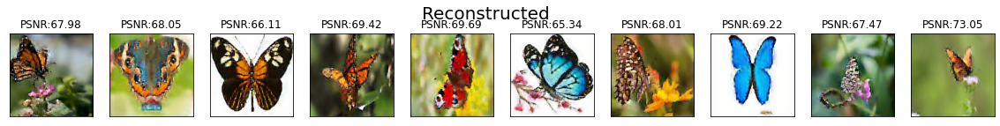

With sgd optimizer and 300 epochs


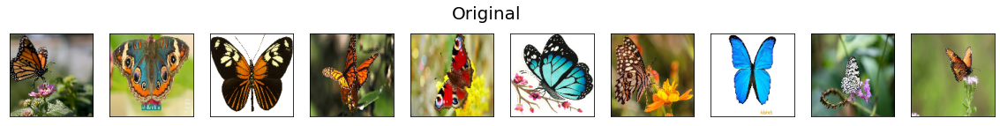

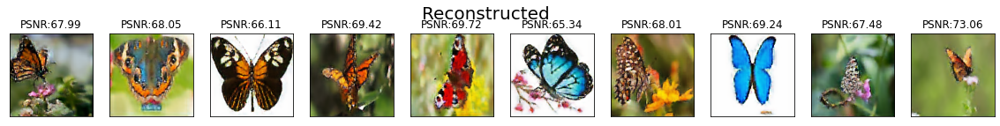

100%|██████████| 6/6 [07:02<00:00, 70.37s/it]


In [40]:
for i in tqdm(["adam","rmsprop","adadelta","adagrad","nadam","sgd"]):
    for j in [1,50,100,200,300]:
        train_model(input_img,decoded,i,j,4)

  0%|          | 0/6 [00:00<?, ?it/s]

With adam optimizer


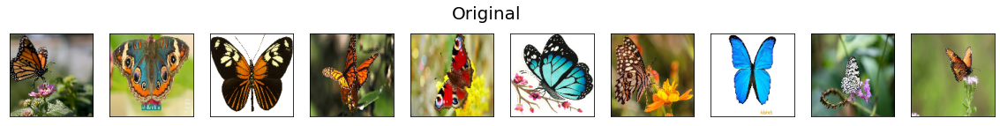

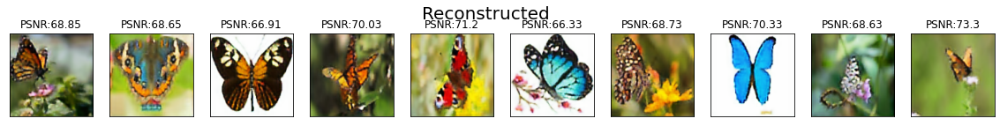

 17%|█▋        | 1/6 [00:11<00:58, 11.80s/it]

With rmsprop optimizer


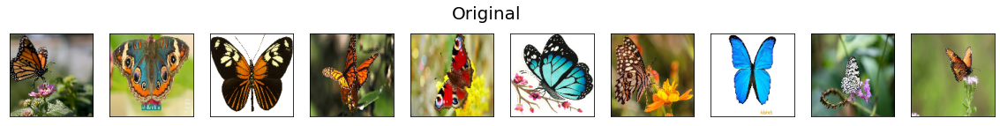

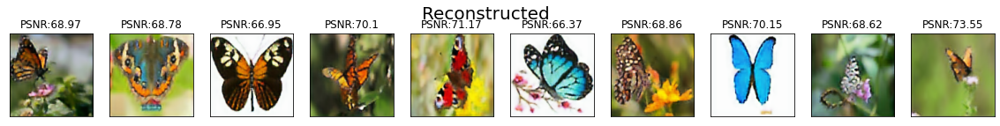

 33%|███▎      | 2/6 [00:23<00:47, 11.98s/it]

With adadelta optimizer


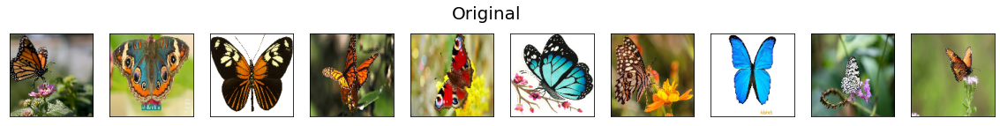

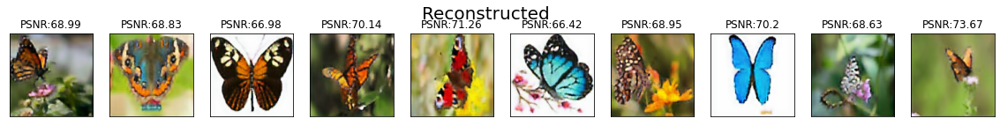

 50%|█████     | 3/6 [00:35<00:35, 11.85s/it]

With adagrad optimizer


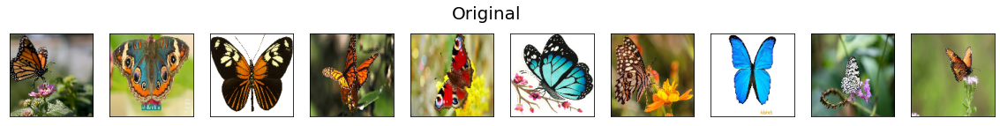

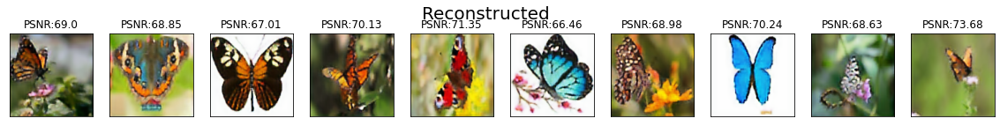

 67%|██████▋   | 4/6 [00:43<00:20, 10.41s/it]

With nadam optimizer


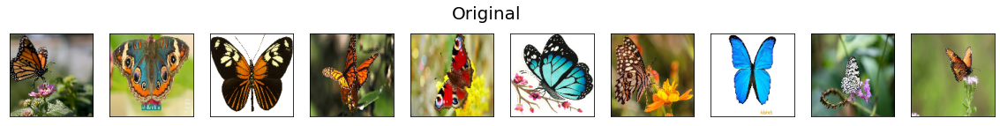

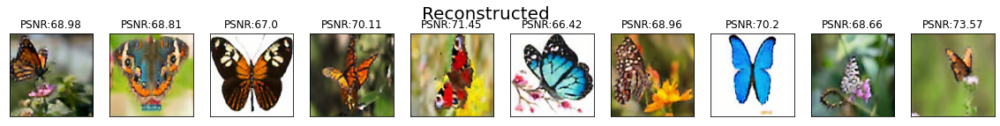

 83%|████████▎ | 5/6 [00:55<00:11, 11.02s/it]

With sgd optimizer


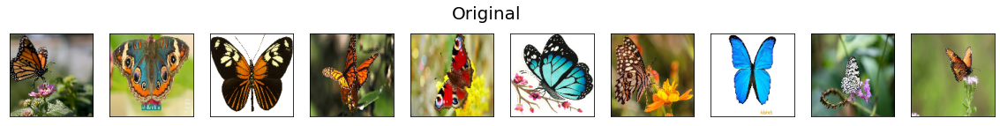

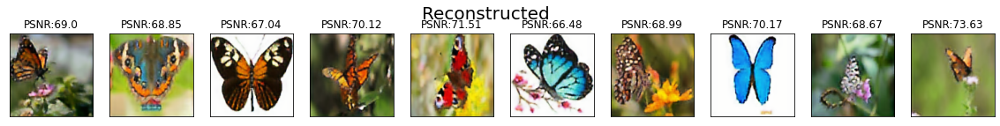

100%|██████████| 6/6 [01:07<00:00, 11.30s/it]


In [27]:
for i in tqdm(["adam","rmsprop","adadelta","adagrad","nadam","sgd"]):
    train_model(input_img,decoded,i,100,4)